<center><h1>Hong_Seungil_HW6</h1></center>

Name: Seungil Hong
<br>
Github Username: zonna19
<br>
USC ID: 2375832093 

## 1. Tree-Based Methods

Import packages

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, roc_curve, auc, f1_score, accuracy_score, classification_report
from xgboost import XGBClassifier
from sklearn.model_selection import LeaveOneOut, GridSearchCV,StratifiedKFold ,KFold, cross_val_score
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings('ignore')

### (a) Download the APS Failure data

In [2]:
raw_tr_df = pd.read_csv('../data/aps_failure_training_set.csv', skiprows=20, na_values='na')
raw_te_df = pd.read_csv('../data/aps_failure_test_set.csv', skiprows=20, na_values='na')

In [3]:
raw_tr_df

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,76698,NaN,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,neg,33058,NaN,0.000000e+00,NaN,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,neg,41040,NaN,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,neg,12,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,neg,60874,NaN,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,neg,153002,NaN,6.640000e+02,186.0,0.0,0.0,0.0,0.0,0.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,neg,2286,NaN,2.130707e+09,224.0,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,neg,112,0.0,2.130706e+09,18.0,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,neg,80292,NaN,2.130706e+09,494.0,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


In [4]:
raw_te_df

,class,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,neg,60,0.0,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
1,neg,82,0.0,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
2,neg,66002,2.0,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
3,neg,59816,NaN,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
4,neg,1814,NaN,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,neg,81852,NaN,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
15996,neg,18,0.0,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
15997,neg,79636,NaN,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
15998,neg,110,NaN,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


### (b) Data Preparation

#### (i) Research what types of techniques are usually used

> * Imputation
>> * Mean/Median/Mode Imputation: Replace missing values with the mean (for continuous data), median (when the data has outliers), or mode (for categorical data).
>> * Linear Interpolation: Filling in missing values based on linear trends from neighboring values.
>> * K-Nearest Neighbors (KNN) Imputation: Finding 'k' similar records and filling in the missing value based on their values.
>> * Regression Imputation: Predicting missing values using other related variables.
>> * Stochastic Regression Imputation: Adds a random residual value to the regression prediction.
>> * Model-based Imputation: Uses statistical models such as Bayesian networks or decision trees to predict missing values.
> * Advanced Imputation:
>> * Multiple Imputation: Multiple sets of imputations are created (via Monte Carlo simulation), then averaged. The analysis of multiple imputed datasets reflects the uncertainty of imputed values.
>> * Deep Learning: Neural networks can be trained to detect patterns and fill in missing values.
>> * Iterative Imputer (MICE - Multivariate Imputation by Chained Equations): Imputes data under the assumption that the missing data are Missing At Random (MAR).
> * Substitution:
>> * Last Observation Carried Forward (LOCF) and Next Observation Carried Backward (NOCB): These are often used in time series where the previous or next observation is used to fill in the gap.
> * Adding a 'Missing' Category: Especially for categorical data, adding a new category to indicate missingness can be useful.
> * Using Algorithms Robust to Missing Values: Some algorithms like XGBoost or LightGBM can handle missing values without requiring any imputation.
> * Multiple Imputation with Predictive Mean Matching (PMM): PMM imputes values from observed data that are similar in prediction to the missing value.
>
> Reference : https://scikit-learn.org/stable/modules/impute.html


> During HW05, mean method by simpleimputer worked pretty well so I will use mean this time as well. It is also general way to impute missing values.
> after 1(b)-iv, I re-review this question and rewrite the code to use 'median' since the data has to many outliers.

In [5]:
# Split x and y
X_tr_df = raw_tr_df.iloc[:, 1:]
y_tr_df = raw_tr_df.iloc[:, 0:1]
X_te_df = raw_te_df.iloc[:, 1:]
y_te_df = raw_te_df.iloc[:, 0:1]

In [6]:
# Identify features with missing values
missing_data = X_tr_df.isnull().sum()

# print columns with missing values
print("Missing Data columns\n", missing_data[missing_data > 0],"\n==========================")  

# Use SimpleImputer imputation to handle missing values for training "imputer.fit_transform()"
imputer = SimpleImputer(strategy='median') # too much outliers to use mean, so use median
X_tr_imputed = pd.DataFrame(imputer.fit_transform(X_tr_df), columns=X_tr_df.columns)

# Check if there's any missing data left
print(X_tr_imputed.isnull().sum().sum())  # This should return 0

Missing Data columns
 ab_000    46329
ac_000     3335
ad_000    14861
ae_000     2500
af_000     2500
          ...  
ee_007      671
ee_008      671
ee_009      671
ef_000     2724
eg_000     2723
Length: 169, dtype: int64 
0


In [7]:
X_tr_imputed

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698.0,0.0,2.130706e+09,280.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1240520.0,493384.0,721044.0,469792.0,339156.0,157956.0,73224.0,0.0,0.0,0.0
1,33058.0,0.0,0.000000e+00,126.0,0.0,0.0,0.0,0.0,0.0,0.0,...,421400.0,178064.0,293306.0,245416.0,133654.0,81140.0,97576.0,1500.0,0.0,0.0
2,41040.0,0.0,2.280000e+02,100.0,0.0,0.0,0.0,0.0,0.0,0.0,...,277378.0,159812.0,423992.0,409564.0,320746.0,158022.0,95128.0,514.0,0.0,0.0
3,12.0,0.0,7.000000e+01,66.0,0.0,10.0,0.0,0.0,0.0,318.0,...,240.0,46.0,58.0,44.0,10.0,0.0,0.0,0.0,4.0,32.0
4,60874.0,0.0,1.368000e+03,458.0,0.0,0.0,0.0,0.0,0.0,0.0,...,622012.0,229790.0,405298.0,347188.0,286954.0,311560.0,433954.0,1218.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,153002.0,0.0,6.640000e+02,186.0,0.0,0.0,0.0,0.0,0.0,2564.0,...,998500.0,566884.0,1290398.0,1218244.0,1019768.0,717762.0,898642.0,28588.0,0.0,0.0
59996,2286.0,0.0,2.130707e+09,224.0,0.0,0.0,0.0,0.0,0.0,0.0,...,10578.0,6760.0,21126.0,68424.0,136.0,0.0,0.0,0.0,0.0,0.0
59997,112.0,0.0,2.130706e+09,18.0,0.0,0.0,0.0,0.0,0.0,0.0,...,792.0,386.0,452.0,144.0,146.0,2622.0,0.0,0.0,0.0,0.0
59998,80292.0,0.0,2.130706e+09,494.0,0.0,0.0,0.0,0.0,0.0,0.0,...,699352.0,222654.0,347378.0,225724.0,194440.0,165070.0,802280.0,388422.0,0.0,0.0


In [8]:
# Use the same imputer to handle missing values for test set
X_te_imputed = pd.DataFrame(imputer.transform(X_te_df), columns=X_te_df.columns)

# Check if there's any missing data left in test set
print(X_te_imputed.isnull().sum().sum())  # This should return 0

0


In [9]:
X_te_imputed

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,60.0,0.0,2.000000e+01,12.0,0.0,0.0,0.0,0.0,0.0,2682.0,...,1098.0,138.0,412.0,654.0,78.0,88.0,0.0,0.0,0.0,0.0
1,82.0,0.0,6.800000e+01,40.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1068.0,276.0,1620.0,116.0,86.0,462.0,0.0,0.0,0.0,0.0
2,66002.0,2.0,2.120000e+02,112.0,0.0,0.0,0.0,0.0,0.0,199486.0,...,495076.0,380368.0,440134.0,269556.0,1315022.0,153680.0,516.0,0.0,0.0,0.0
3,59816.0,0.0,1.010000e+03,936.0,0.0,0.0,0.0,0.0,0.0,0.0,...,540820.0,243270.0,483302.0,485332.0,431376.0,210074.0,281662.0,3232.0,0.0,0.0
4,1814.0,0.0,1.560000e+02,140.0,0.0,0.0,0.0,0.0,0.0,0.0,...,7646.0,4144.0,18466.0,49782.0,3176.0,482.0,76.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,81852.0,0.0,2.130706e+09,892.0,0.0,0.0,0.0,0.0,0.0,0.0,...,632658.0,273242.0,510354.0,373918.0,349840.0,317840.0,960024.0,25566.0,0.0,0.0
15996,18.0,0.0,5.200000e+01,46.0,8.0,26.0,0.0,0.0,0.0,0.0,...,266.0,44.0,46.0,14.0,2.0,0.0,0.0,0.0,0.0,0.0
15997,79636.0,0.0,1.670000e+03,1518.0,0.0,0.0,0.0,0.0,0.0,0.0,...,806832.0,449962.0,778826.0,581558.0,375498.0,222866.0,358934.0,19548.0,0.0,0.0
15998,110.0,0.0,3.600000e+01,32.0,0.0,0.0,0.0,0.0,0.0,0.0,...,588.0,210.0,180.0,544.0,1004.0,1338.0,74.0,0.0,0.0,0.0


#### (ii) Calculate the coefficient of variation

In [10]:
describe = X_tr_imputed.describe(include='all')
describe.loc[['std','mean']]


,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
std,145430.056532,1.687318,7.767625e+08,3.504525e+07,158.147893,205.387115,20363.644580,34008.905467,149481.840081,757517.085558,...,1.149276e+06,540372.543877,1.162002e+06,1.114964e+06,1.063465e+06,1.718666e+06,447214.53727,47212.48533,4.268570,8.628043
mean,59336.499567,0.162500,3.362258e+08,1.434383e+05,6.535000,10.548200,219.157733,964.810433,8509.770600,87600.535267,...,4.431223e+05,210018.844967,4.432268e+05,3.916653e+05,3.303672e+05,3.428586e+05,137221.15040,8295.09860,0.086467,0.203100


In [11]:
std = describe.loc['std']
mean = describe.loc['mean']
describe.loc['CV'] = std / mean
coef_vars_df = describe.loc[['std','mean','CV']]

# Set the display format for float values
pd.set_option('display.float_format', '{:.3f}'.format)

coef_vars_df

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
std,145430.057,1.687,776762540.205,35045247.405,158.148,205.387,20363.645,34008.905,149481.840,757517.086,...,1149275.777,540372.544,1162001.873,1114964.483,1063465.488,1718665.607,447214.537,47212.485,4.269,8.628
mean,59336.500,0.163,336225812.027,143438.292,6.535,10.548,219.158,964.810,8509.771,87600.535,...,443122.287,210018.845,443226.821,391665.265,330367.237,342858.574,137221.150,8295.099,0.086,0.203
CV,2.451,10.383,2.310,244.323,24.200,19.471,92.918,35.249,17.566,8.647,...,2.594,2.573,2.622,2.847,3.219,5.013,3.259,5.692,49.367,42.482


#### (iii) Plot a correlation matrix

In [12]:
# Concat both imputed dataset
aps_imputed = pd.concat([X_tr_imputed,X_te_imputed])
aps_imputed

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698.000,0.000,2130706438.000,280.000,0.000,0.000,0.000,0.000,0.000,0.000,...,1240520.000,493384.000,721044.000,469792.000,339156.000,157956.000,73224.000,0.000,0.000,0.000
1,33058.000,0.000,0.000,126.000,0.000,0.000,0.000,0.000,0.000,0.000,...,421400.000,178064.000,293306.000,245416.000,133654.000,81140.000,97576.000,1500.000,0.000,0.000
2,41040.000,0.000,228.000,100.000,0.000,0.000,0.000,0.000,0.000,0.000,...,277378.000,159812.000,423992.000,409564.000,320746.000,158022.000,95128.000,514.000,0.000,0.000
3,12.000,0.000,70.000,66.000,0.000,10.000,0.000,0.000,0.000,318.000,...,240.000,46.000,58.000,44.000,10.000,0.000,0.000,0.000,4.000,32.000
4,60874.000,0.000,1368.000,458.000,0.000,0.000,0.000,0.000,0.000,0.000,...,622012.000,229790.000,405298.000,347188.000,286954.000,311560.000,433954.000,1218.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,81852.000,0.000,2130706432.000,892.000,0.000,0.000,0.000,0.000,0.000,0.000,...,632658.000,273242.000,510354.000,373918.000,349840.000,317840.000,960024.000,25566.000,0.000,0.000
15996,18.000,0.000,52.000,46.000,8.000,26.000,0.000,0.000,0.000,0.000,...,266.000,44.000,46.000,14.000,2.000,0.000,0.000,0.000,0.000,0.000
15997,79636.000,0.000,1670.000,1518.000,0.000,0.000,0.000,0.000,0.000,0.000,...,806832.000,449962.000,778826.000,581558.000,375498.000,222866.000,358934.000,19548.000,0.000,0.000
15998,110.000,0.000,36.000,32.000,0.000,0.000,0.000,0.000,0.000,0.000,...,588.000,210.000,180.000,544.000,1004.000,1338.000,74.000,0.000,0.000,0.000


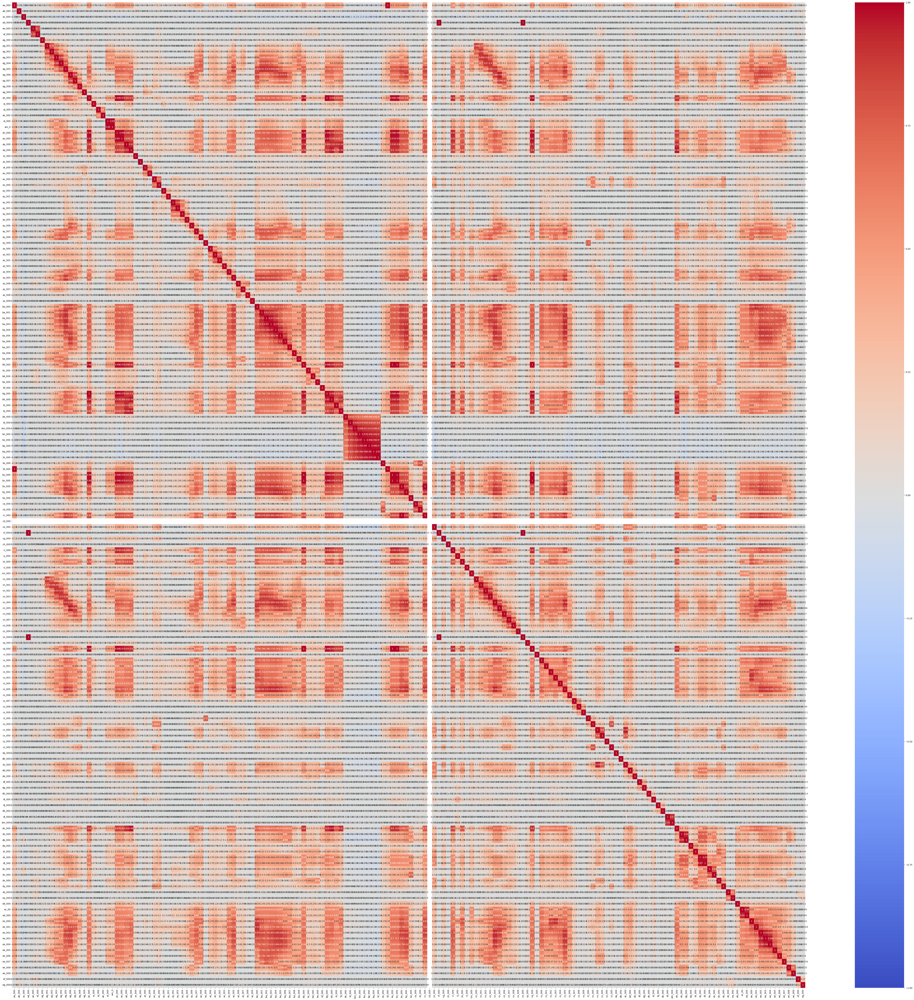

In [13]:
# Compute the correlation matrix
corr_matrix = aps_imputed.corr()

# Plot the heatmap
plt.figure(figsize=(80, 80))
sns.heatmap(corr_matrix, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.show()

#### (iv) Make scatter plots and box plots, Pick $\lfloor\sqrt{170}\rfloor$ features with highest $CV$, and make scatter plots and box plots for them, similar to those on p. 129 of ISLR. Can you draw conclusions about significance of those features, just by the scatter plots? This does not mean that you will only use those features in the following questions. We picked them only for visualization.

In [14]:
aps_y = pd.concat([y_tr_df, y_te_df])
aps_y

,class
0,neg
1,neg
2,neg
3,neg
4,neg
...,...
15995,neg
15996,neg
15997,neg
15998,neg


In [15]:
coef_vars_descending = coef_vars_df.loc['CV'].sort_values(ascending=False)
coef_vars_descending.head(25)

cf_000   244.888
co_000   244.507
ad_000   244.323
cs_009   237.931
dh_000   123.216
dj_000   117.494
ag_000    92.918
as_000    87.332
ay_009    84.734
ak_000    80.425
az_009    77.839
ch_000    77.454
au_000    68.883
cr_000    58.078
ay_001    52.825
df_000    52.293
dz_000    51.332
ef_000    49.367
cs_008    48.102
aj_000    44.266
eg_000    42.482
dl_000    39.739
ay_002    39.249
dg_000    38.486
ay_000    37.428
Name: CV, dtype: float64

In [16]:
# Calculate number of features to pick
rank = int(np.sqrt(170))

# Sort features by CV and pick top features
top_features = coef_vars_descending.head(rank).index
top_features

Index(['cf_000', 'co_000', 'ad_000', 'cs_009', 'dh_000', 'dj_000', 'ag_000',
       'as_000', 'ay_009', 'ak_000', 'az_009', 'ch_000', 'au_000'],
      dtype='object')

In [17]:
# Putting back all data for pairplot
top_subset_df = aps_imputed[top_features]
top_subset_df = pd.concat([top_subset_df,aps_y], axis=1)
top_subset_df

,cf_000,co_000,ad_000,cs_009,dh_000,dj_000,ag_000,as_000,ay_009,ak_000,az_009,ch_000,au_000,class
0,2.000,220.000,280.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,neg
1,2.000,8.000,126.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,neg
2,0.000,0.000,100.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,neg
3,2.000,2.000,66.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,neg
4,0.000,202.000,458.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,neg
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15995,2.000,42.000,892.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,neg
15996,2.000,0.000,46.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,neg
15997,2.000,378.000,1518.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,neg
15998,0.000,0.000,32.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,neg


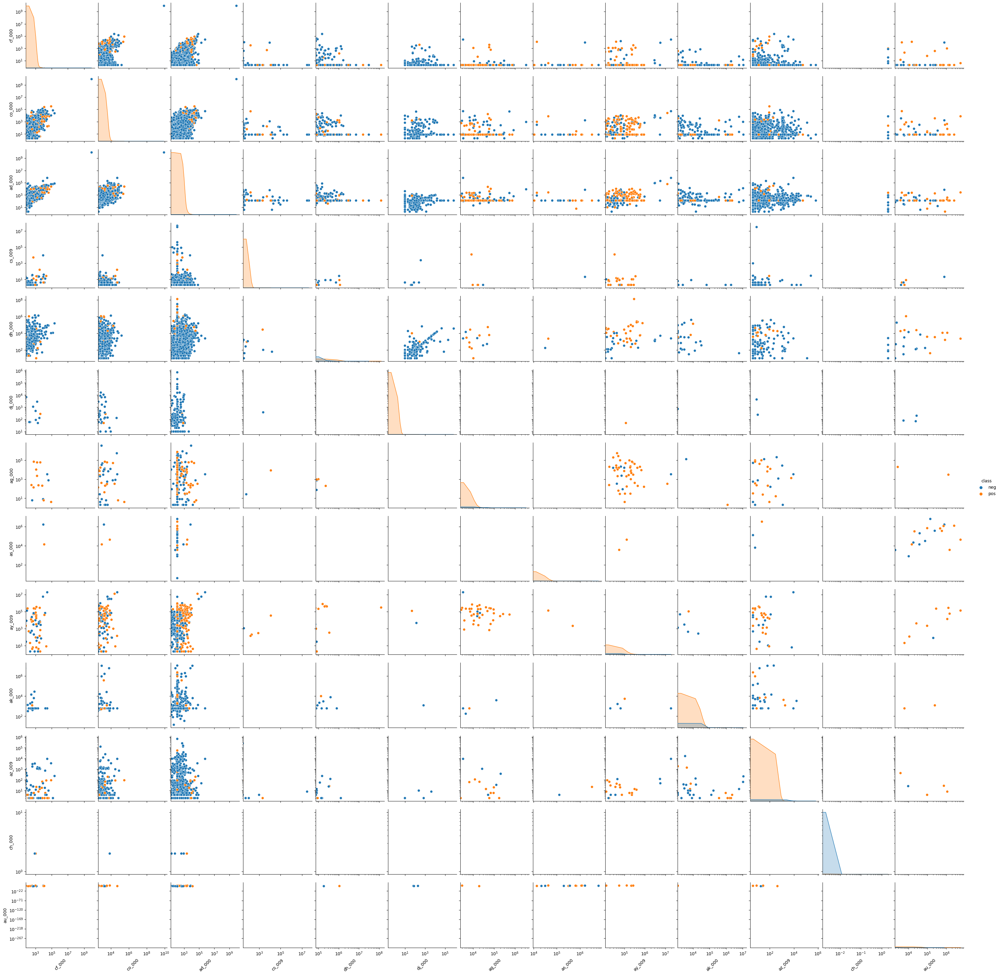

In [18]:
# Create the pairplot 
grid = sns.pairplot(top_subset_df, hue='class')

for ax in grid.axes.flat:
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.xaxis.label.set_rotation(45)  # Optional

plt.show()

[]

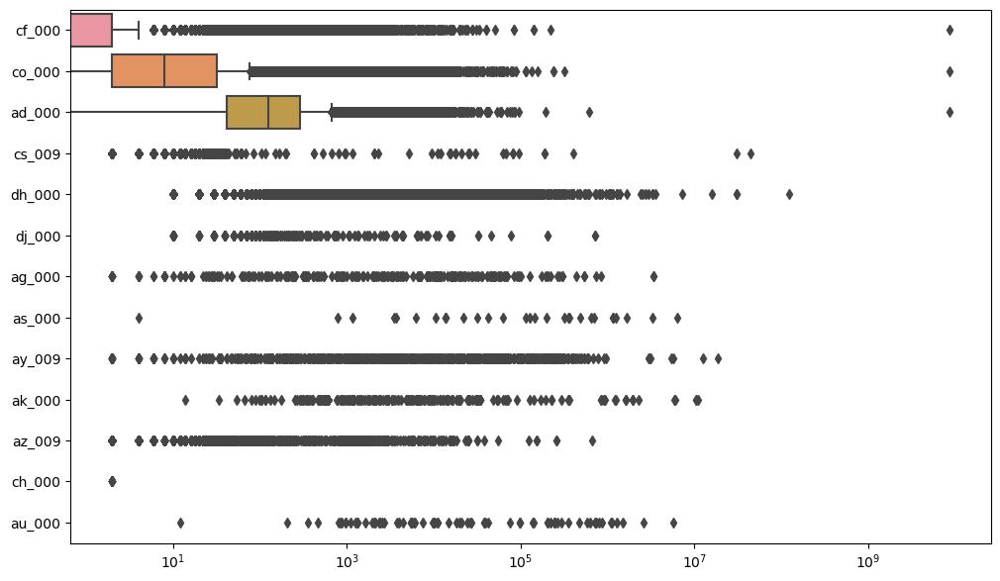

In [19]:
fig, ax = plt.subplots(figsize=(12, 7))
box = sns.boxplot(data=top_subset_df, ax=ax, orient='h')
box.set(xscale="log")
plt.plot()

> I tried standard scales pairplot, it was very hard to recognize the significance since there are too many imputated values and outliers. I tried logscale pairplot just in case, still does not help much, although readable.

> * There are plots of datapoints suggest significancy (e.g. 'ay009', 'cs009' showed some variation paired with any features). However the most of the other plots between attributes among those features do not seem to derive clear conclusions.

#### (v) Is this data set imbalanced?

In [20]:
value_tr_counts = y_tr_df.value_counts()
pos_count = value_tr_counts.get('pos', 0)
neg_count = value_tr_counts.get('neg', 0)
imbalanced_tr = pos_count / neg_count

value_te_counts = y_tr_df.value_counts()
pos_count = value_te_counts.get('pos', 0)
neg_count = value_te_counts.get('neg', 0)
imbalanced_te = pos_count / neg_count
print("Trainingset Counts\n",value_tr_counts)
print("Training Negatives :", round(imbalanced_tr, 4)*100, "%","\n============")
print("Testset Counts\n",value_te_counts)
print("Testset Negatives :", round(imbalanced_te, 4)*100, "%","\n============")

Trainingset Counts
 class
neg      59000
pos       1000
dtype: int64
Training Negatives : 1.69 % 
Testset Counts
 class
neg      59000
pos       1000
dtype: int64
Testset Negatives : 1.69 % 


> * Yes. As per Dr. Rajati's lecture, below 15% is considered severely imbalanced. Both sets are 1.69% of pos case. 

### (c) Train a random forest

In [21]:
X_tr_imputed

,aa_000,ab_000,ac_000,ad_000,ae_000,af_000,ag_000,ag_001,ag_002,ag_003,...,ee_002,ee_003,ee_004,ee_005,ee_006,ee_007,ee_008,ee_009,ef_000,eg_000
0,76698.000,0.000,2130706438.000,280.000,0.000,0.000,0.000,0.000,0.000,0.000,...,1240520.000,493384.000,721044.000,469792.000,339156.000,157956.000,73224.000,0.000,0.000,0.000
1,33058.000,0.000,0.000,126.000,0.000,0.000,0.000,0.000,0.000,0.000,...,421400.000,178064.000,293306.000,245416.000,133654.000,81140.000,97576.000,1500.000,0.000,0.000
2,41040.000,0.000,228.000,100.000,0.000,0.000,0.000,0.000,0.000,0.000,...,277378.000,159812.000,423992.000,409564.000,320746.000,158022.000,95128.000,514.000,0.000,0.000
3,12.000,0.000,70.000,66.000,0.000,10.000,0.000,0.000,0.000,318.000,...,240.000,46.000,58.000,44.000,10.000,0.000,0.000,0.000,4.000,32.000
4,60874.000,0.000,1368.000,458.000,0.000,0.000,0.000,0.000,0.000,0.000,...,622012.000,229790.000,405298.000,347188.000,286954.000,311560.000,433954.000,1218.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
59995,153002.000,0.000,664.000,186.000,0.000,0.000,0.000,0.000,0.000,2564.000,...,998500.000,566884.000,1290398.000,1218244.000,1019768.000,717762.000,898642.000,28588.000,0.000,0.000
59996,2286.000,0.000,2130706538.000,224.000,0.000,0.000,0.000,0.000,0.000,0.000,...,10578.000,6760.000,21126.000,68424.000,136.000,0.000,0.000,0.000,0.000,0.000
59997,112.000,0.000,2130706432.000,18.000,0.000,0.000,0.000,0.000,0.000,0.000,...,792.000,386.000,452.000,144.000,146.000,2622.000,0.000,0.000,0.000,0.000
59998,80292.000,0.000,2130706432.000,494.000,0.000,0.000,0.000,0.000,0.000,0.000,...,699352.000,222654.000,347378.000,225724.000,194440.000,165070.000,802280.000,388422.000,0.000,0.000


In [22]:
y_tr_df

,class
0,neg
1,neg
2,neg
3,neg
4,neg
...,...
59995,neg
59996,neg
59997,neg
59998,neg


In [23]:
rf1 = RandomForestClassifier(n_estimators=100, oob_score=True, random_state=42)  # Using 100 trees and a random state for reproducibility
rf1.fit(X_tr_imputed, y_tr_df)


RandomForestClassifier(oob_score=True, random_state=42)

In [24]:
predictions1 = rf1.predict(X_te_imputed)
accuracy = accuracy_score(y_te_df, predictions1) 
print(f"Accuracy: {accuracy * 100:.2f}%")

report = classification_report(y_te_df, predictions1)
print(report)

Accuracy: 99.24%
              precision    recall  f1-score   support

         neg       0.99      1.00      1.00     15625
         pos       0.95      0.72      0.82       375

    accuracy                           0.99     16000
   macro avg       0.97      0.86      0.91     16000
weighted avg       0.99      0.99      0.99     16000



In [25]:
train_probs = rf1.predict_proba(X_tr_imputed)[:,1] # Probabilities for the positive class
test_probs = rf1.predict_proba(X_te_imputed)[:,1]

train_preds = rf1.predict(X_tr_imputed)
test_preds = rf1.predict(X_te_imputed)

cm_train = confusion_matrix(y_tr_df, train_preds)
cm_test = confusion_matrix(y_te_df, test_preds)

print("Confusion Matrix (Training):")
print(cm_train)
print("\nConfusion Matrix (Testing):")
print(cm_test)

Confusion Matrix (Training):
[[59000     0]
 [    1   999]]

Confusion Matrix (Testing):
[[15610    15]
 [  106   269]]


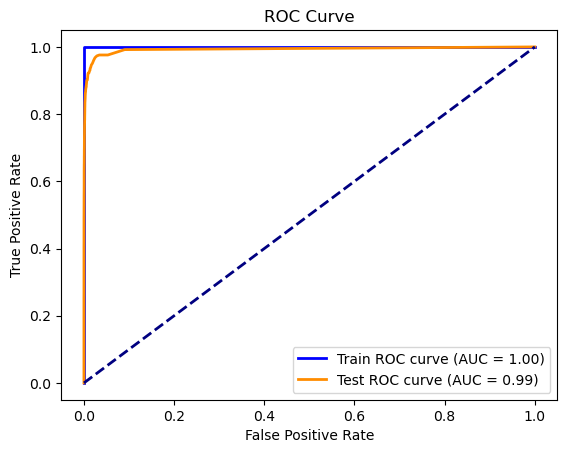

In [26]:
fpr_train, tpr_train, _ = roc_curve(y_tr_df, train_probs, pos_label='pos')
fpr_test, tpr_test, _ = roc_curve(y_te_df, test_probs, pos_label='pos')

roc_auc_train = auc(fpr_train, tpr_train)
roc_auc_test = auc(fpr_test, tpr_test)

plt.figure()
lw = 2  # Line width
plt.plot(fpr_train, tpr_train, color='blue', lw=lw, label=f'Train ROC curve (AUC = {roc_auc_train:.2f})')
plt.plot(fpr_test, tpr_test, color='darkorange', lw=lw, label=f'Test ROC curve (AUC = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

In [27]:
misclassification_train = 1 - accuracy_score(y_tr_df, train_preds)
misclassification_test = 1 - accuracy_score(y_te_df, test_preds)

print(f"Misclassification Rate (Training): {misclassification_train:.4f}")
print(f"Misclassification Rate (Testing): {misclassification_test:.4f}")

Misclassification Rate (Training): 0.0000
Misclassification Rate (Testing): 0.0076


In [28]:
oob_error = 1 - rf1.oob_score_
print(f"OOB Error: {oob_error:.4f}")

OOB Error: 0.0062


In [29]:
test_predictions = rf1.predict(X_te_imputed)
test_error = np.mean(test_predictions == y_te_df.squeeze())
test_error = 1 - test_error
print(f"Test Error: {test_error:.4f}")

Test Error: 0.0076


### (d) Research class imbalance in random forest

1. Bootstrap Sampling:
* By default, each tree in a random forest is built on a bootstrap sample, which means a subset of the data is sampled with replacement. Even without doing anything specific for imbalance, there's a chance that each tree sees a somewhat different distribution of the classes.
However, this alone might not be sufficient for severe class imbalances.

2. Class Weighting:
* Many implementations of random forests, including Scikit-learn’s, allow you to set weights for classes. When you increase the weight of the minority class, the algorithm becomes more sensitive to it.

3. Balanced Subsampling:
* Instead of taking a bootstrap sample from the entire dataset, take a balanced sample. This means you'd sample an equal number of instances from each class for every tree. This way, every tree gets trained on a balanced dataset.
Synthetic Data Generation:

4. SMOTE (Synthetic Minority Over-sampling Technique)
* can be used to generate synthetic samples in the feature space. However, it's crucial to only synthesize data in the training set to avoid data leakage.
Once synthetic samples are added to balance the classes, a random forest can be trained on the augmented dataset.

5. Anomaly Detection Perspective:
* If one class is extremely rare, the problem can sometimes be treated as an anomaly detection task instead of a classification task. Isolation Forest is an algorithm based on random forests specifically designed for anomaly detection.

6. Combine Trees Using Different Rules:
* When aggregating predictions from individual trees (in the case of classification), instead of using a simple majority vote, one can use rules that are more sensitive to the minority class, such as weighted voting based on class weights.

7. Post-hoc Adjustments:
* After a model has been trained, you can adjust the classification threshold to improve sensitivity to the minority class. By default, a threshold of 0.5 is used for binary classification, but this can be adjusted to achieve the desired balance between precision and recall.

###  Compensate for class imbalance in your random forest and repeat 1c. Compare the results with those of 1c

> I will use Class Weighting method for this problem.

In [30]:
rf2 = RandomForestClassifier(n_estimators=100, oob_score=True, random_state=42, class_weight='balanced')  # Using 100 trees and a random state for reproducibility
rf2.fit(X_tr_imputed, y_tr_df)
predictions2 = rf2.predict(X_te_imputed)

In [31]:
accuracy2 = accuracy_score(y_te_df, predictions2) 
print(f"Accuracy: {accuracy2 * 100:.2f}%")

report2 = classification_report(y_te_df, predictions2)
print(report2)

Accuracy: 98.91%
              precision    recall  f1-score   support

         neg       0.99      1.00      0.99     15625
         pos       0.94      0.57      0.71       375

    accuracy                           0.99     16000
   macro avg       0.96      0.79      0.85     16000
weighted avg       0.99      0.99      0.99     16000



In [32]:
train_probs2 = rf2.predict_proba(X_tr_imputed)[:,1] # Probabilities for the positive class
test_probs2 = rf2.predict_proba(X_te_imputed)[:,1]

train_preds2 = rf2.predict(X_tr_imputed)
test_preds2 = rf2.predict(X_te_imputed)

cm_train2 = confusion_matrix(y_tr_df, train_preds2)
cm_test2 = confusion_matrix(y_te_df, test_preds2)

print("Confusion Matrix (Training):")
print(cm_train2)
print("\nConfusion Matrix (Testing):")
print(cm_test2)

Confusion Matrix (Training):
[[59000     0]
 [    1   999]]

Confusion Matrix (Testing):
[[15611    14]
 [  160   215]]


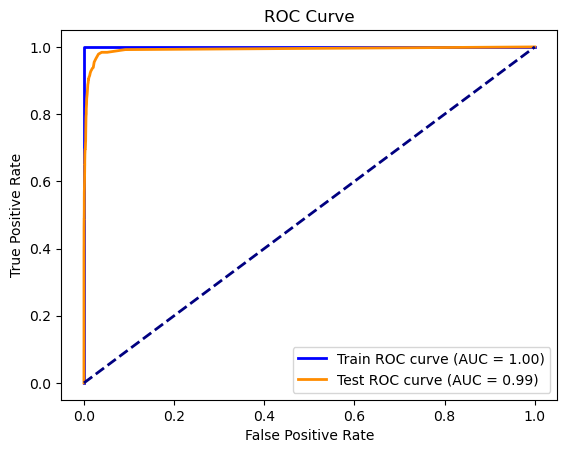

In [33]:
fpr_train2, tpr_train2, _ = roc_curve(y_tr_df, train_probs2, pos_label='pos')
fpr_test2, tpr_test2, _ = roc_curve(y_te_df, test_probs2, pos_label='pos')

roc_auc_train2 = auc(fpr_train2, tpr_train2)
roc_auc_test2 = auc(fpr_test2, tpr_test2)

plt.figure()
lw = 2  # Line width
plt.plot(fpr_train2, tpr_train2, color='blue', lw=lw, label=f'Train ROC curve (AUC = {roc_auc_train2:.2f})')
plt.plot(fpr_test2, tpr_test2, color='darkorange', lw=lw, label=f'Test ROC curve (AUC = {roc_auc_test2:.2f})')
plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc="lower right")
plt.show()

In [34]:
misclassification_train2 = 1 - accuracy_score(y_tr_df, train_preds2)
misclassification_test2 = 1 - accuracy_score(y_te_df, test_preds2)

print(f"Misclassification Rate (Training): {misclassification_train2:.4f}")
print(f"Misclassification Rate (Testing): {misclassification_test2:.4f}")

Misclassification Rate (Training): 0.0000
Misclassification Rate (Testing): 0.0109


In [35]:
oob_error2 = 1 - rf2.oob_score_
print(f"OOB Error: {oob_error2:.4f}")
test_predictions2 = rf2.predict(X_te_imputed)
test_accuracy2 = np.mean(test_predictions2 == y_te_df.squeeze())
test_error2 = 1 - test_accuracy2
print(f"Test Error: {test_error2:.4f}")

OOB Error: 0.0082
Test Error: 0.0109


> * Using Class Weighting method to balancing the imbalance is not showing significant better performance in this case. Recall is went down from 0.86 to 0.57. Thus technically worsen the performance of predictability.

### (e) XGBoost and Model Trees

#### L1-Pnenalized Logistic Regression

In [36]:
# Using XGboost to fit the model tree
xgb = XGBClassifier(objective='binary:logistic', 
                              colsample_bytree = 0.3, learning_rate = 0.1, use_label_encoder=False)
alphas = {"reg_alpha": [0.01, 0.05,0.07,0.08,0.09, 0.1, 0.2, 0.5, 0.75, 1, 2, 3]}

In [44]:
# Changing values to binary
y_tr_df['class'].replace({'neg':0,'pos':1},inplace=True)
y_te_df['class'].replace({'neg':0,'pos':1},inplace=True)

In [46]:
y_tr_df

,class
0,0
1,0
2,0
3,0
4,0
...,...
59995,0
59996,0
59997,0
59998,0


In [45]:
y_te_df

,class
0,0
1,0
2,0
3,0
4,0
...,...
15995,0
15996,0
15997,0
15998,0


### 5-Fold

In [75]:
kf = KFold(n_splits=5,shuffle=True,random_state=42)
clf_5kf = GridSearchCV(xgb, alphas, n_jobs=-1, cv=kf, scoring="accuracy")
clf_5kf.fit(X_tr_imputed, y_tr_df)

print('Cross validation accuracy :',round(clf_5kf.best_score_,4),
      '\n@ The best alpha : ', clf_5kf.best_params_)

Cross validation accuracy : 0.9944 
@ The best alpha :  {'reg_alpha': 0.05}


In [85]:
# Fit the best estimator on the training data
best_clf_5kf = clf_5kf.best_estimator_
y_train_pred = best_clf_5kf.predict(X_tr_imputed)
y_test_pred = best_clf_5kf.predict(X_te_imputed)

# Confusion Matrix
print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_tr_df, y_train_pred))

train_error = 1 - accuracy_score(y_tr_df, y_train_pred)
print("\nTraining Error:")
print(f'{train_error:.4f}')

print("\nTest Confusion Matrix:")
print(confusion_matrix(y_te_df, y_test_pred))

test_error = 1- accuracy_score(y_te_df, y_test_pred)
print("\nTest Error:")
print(f'{test_error:.4f}')


Training Confusion Matrix:
[[58999     1]
 [   40   960]]

Training Error:
0.0007

Test Confusion Matrix:
[[15614    11]
 [   86   289]]

Test Error:
0.0061


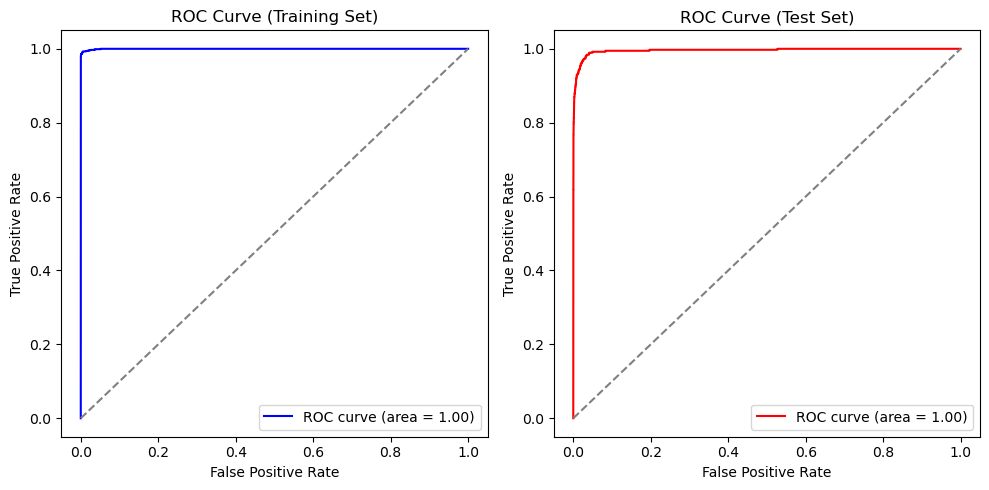

In [77]:
# ROC & AUC for Training set
y_train_prob = best_clf_5kf.predict_proba(X_tr_imputed)[:,1]
fpr_train, tpr_train, _ = roc_curve(y_tr_df, y_train_prob)
roc_auc_train = auc(fpr_train, tpr_train)

plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.plot(fpr_train, tpr_train, color='blue', label=f'ROC curve (area = {roc_auc_train:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Training Set)')
plt.legend(loc="lower right")

# ROC & AUC for Test set
y_test_prob = best_clf_5kf.predict_proba(X_te_imputed)[:,1]
fpr_test, tpr_test, _ = roc_curve(y_te_df, y_test_prob)
roc_auc_test = auc(fpr_test, tpr_test)

plt.subplot(1, 2, 2)
plt.plot(fpr_test, tpr_test, color='red', label=f'ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Test Set)')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()

### 10-Fold

In [78]:
kf_10 = KFold(n_splits=10,shuffle=True,random_state=42)
clf_10kf = GridSearchCV(xgb, alphas, n_jobs=-1, cv=kf_10, scoring="accuracy")
clf_10kf.fit(X_tr_imputed, y_tr_df)

print('Cross validation accuracy on training set :',round(clf_10kf.best_score_,4),
      '\n@ The best alpha : ', clf_10kf.best_params_)

Cross validation accuracy on training set : 0.9944 
@ The best alpha :  {'reg_alpha': 0.09}


In [88]:
# Fit the best estimator on the training data
best_clf = clf_10kf.best_estimator_
y_train_pred = best_clf.predict(X_tr_imputed)
y_test_pred = best_clf.predict(X_te_imputed)

# Confusion Matrix
print("\nTraining Confusion Matrix:")
print(confusion_matrix(y_tr_df, y_train_pred))

train_error = 1 - accuracy_score(y_tr_df, y_train_pred)
print("\nTraining Error:")
print(f'{train_error:.4f}')

print("\nTest Confusion Matrix:")
print(confusion_matrix(y_te_df, y_test_pred))

test_error = 1- accuracy_score(y_te_df, y_test_pred)
print("\nTest Error:")
print(f'{test_error:.4f}')


Training Confusion Matrix:
[[59000     0]
 [   42   958]]

Training Error:
0.0007

Test Confusion Matrix:
[[15614    11]
 [   79   296]]

Test Error:
0.0056


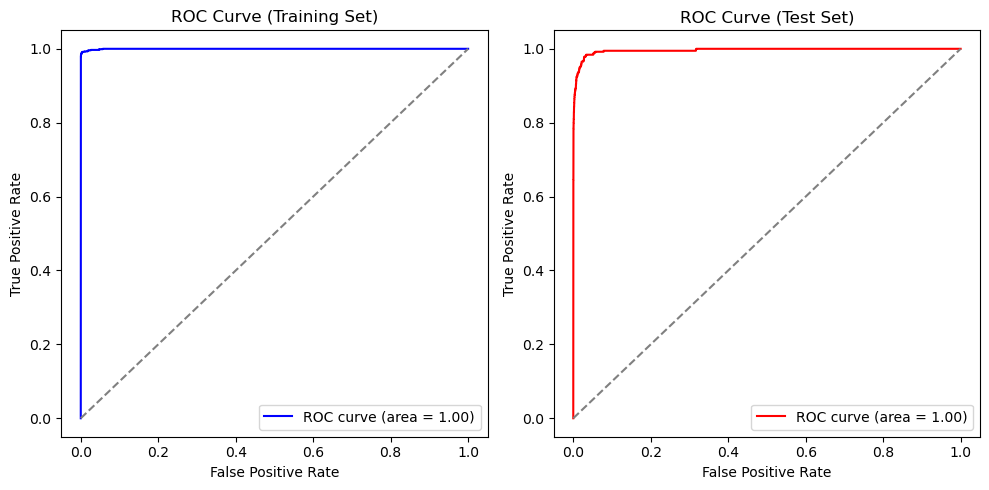

In [80]:
# ROC & AUC for Training set
y_train_prob = best_clf.predict_proba(X_tr_imputed)[:,1]
fpr_train, tpr_train, _ = roc_curve(y_tr_df, y_train_prob)
roc_auc_train = auc(fpr_train, tpr_train)

plt.figure(figsize=(10,5))
plt.subplot(1, 2, 1)
plt.plot(fpr_train, tpr_train, color='blue', label=f'ROC curve (area = {roc_auc_train:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Training Set)')
plt.legend(loc="lower right")

# ROC & AUC for Test set
y_test_prob = best_clf.predict_proba(X_te_imputed)[:,1]
fpr_test, tpr_test, _ = roc_curve(y_te_df, y_test_prob)
roc_auc_test = auc(fpr_test, tpr_test)

plt.subplot(1, 2, 2)
plt.plot(fpr_test, tpr_test, color='red', label=f'ROC curve (area = {roc_auc_test:.2f})')
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve (Test Set)')
plt.legend(loc="lower right")

plt.tight_layout()
plt.show()

### LOOCV

> * Using different alphas took so long time, and waited more than 300min it didn't finish.

In [81]:
'''xgb_fixed_alpha = XGBClassifier(max_depth = 5,
                                objective='binary:logistic', 
                                colsample_bytree=0.3, 
                                learning_rate=0.1, 
                                reg_alpha=0.05, 
                                use_label_encoder=False,
                                tree_method='gpu_hist')
loo = LeaveOneOut()
scores = cross_val_score(xgb_fixed_alpha, X_tr_imputed, y_tr_df, cv=loo, scoring="accuracy")
'''
'''
clf_loocv = GridSearchCV(xgb_fixed_alpha, reg_alpha='0.05', n_jobs=-1, cv=loo, scoring="accuracy")
clf_loocv.fit(X_tr_imputed, y_tr_df)
'''


'\nclf_loocv = GridSearchCV(xgb_fixed_alpha, reg_alpha=\'0.05\', n_jobs=-1, cv=loo, scoring="accuracy")\nclf_loocv.fit(X_tr_imputed, y_tr_df)\n'

> * So far using 10-Fold CV and having Alpha for 0.09 is the best test result.

### (f) Use SMOTE to pre-process your data

## 2. ISLR 6.6.3

## 3. ISLR 6.6.5

## 4. ISLR 8.4.5

## 5. ISLR 9.7.3